### Solving the cocktail party problem with ICA

"Independent component analysis was originally developed to deal with problems that are closely related to the cocktail-party problem. The goal is to find a linear representation of nongaussian data so that the components are statistically independent, or as independent as possible. Such a representation seems to capture the essential structure of the data in many applications, including feature extraction and signal separation." More details on ICA can be found in https://www.cs.helsinki.fi/u/ahyvarin/papers/NN00new.pdf

In this notebook, we take the mixed sounds and images, and apply ICA tn them to separate the sources.

### Sound Component Separation

In [37]:
import numpy as np
from scipy.integrate import quad
#For plotting
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.io import wavfile

In [38]:
fs, data1 = wavfile.read('mix_sound1.wav')
fs, data2 = wavfile.read('mix_sound2.wav')
fs, data3 = wavfile.read('mix_sound3.wav')
#fs is the sample rate, i.e., how many data points in one second.

nsample = len(data1)
data = np.float64(np.c_[data1, data2, data3])
t = np.linspace(0, nsample/fs, nsample, endpoint=True)

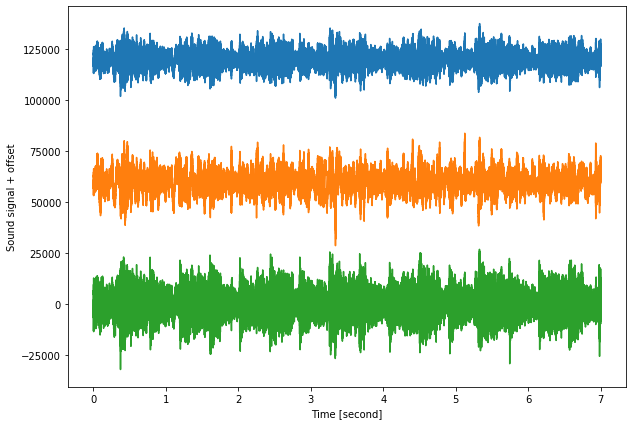

In [39]:
plt.figure(figsize = (10,7))

plt.plot(t, data1+120000, '-')
plt.plot(t, data2+60000, '-')
plt.plot(t, data3, '-')

plt.xlabel('Time [second]')
plt.ylabel('Sound signal + offset')
plt.show()

In [40]:
from IPython.display import Audio

In [41]:
Audio('mix_sound1.wav')

In [42]:
Audio('mix_sound2.wav')

In [43]:
Audio('mix_sound3.wav')

You can tell there are 3 signals mixed in these sounds. You can consider these sounds as recorded by 3 different recorders that have different distrance to the 3 sources. In orther words,
<br><br>
$$ \bf X = A S + \mu$$
<br><br>
where $\boldsymbol X$ is a vector of these 3 sounds, $\boldsymbol S$ is a vector of 3 signals, $\boldsymbol \mu$ is a vector of the mean of $\boldsymbol X$, and $\boldsymbol A$ is the mixing matrix. 
<br><br>
Next, using the sklearn's fastICA module, we will separate the signals from these sounds.
<br><br>
(1) Define the fastICA model:

&nbsp; **ica = FastICA()**

(2) Using "fit_transform," fit the model with the data and obtain the signals

&nbsp; **S = ica.fit_transform(data)**

<span style="color:blue"> <i> 3. Find the 3 signals in the sound files. Plot the signals. (Again, you may plot them with some offsets.)</i></span> <br>

In [44]:
from sklearn.decomposition import FastICA

In [45]:
ica = FastICA()
S = ica.fit_transform(data)  # signals

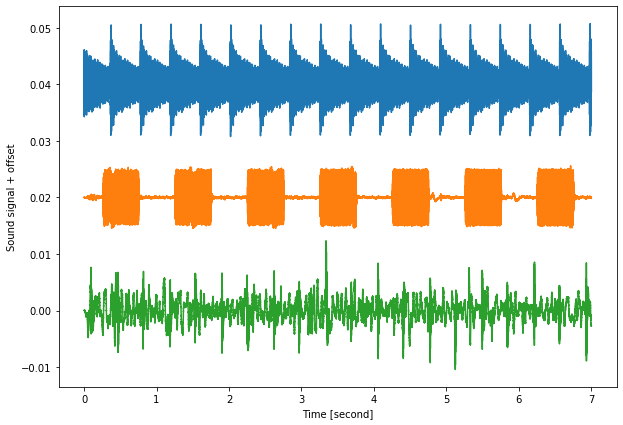

In [46]:
plt.figure(figsize = (10,7))

plt.plot(t, S[:,0]+0.04, '-')
plt.plot(t, S[:,1]+0.02, '-')
plt.plot(t, S[:,2], '-')

plt.xlabel('Time [second]')
plt.ylabel('Sound signal + offset')
plt.show()

You will find the amplitude of the signals is very small. This is because fastICA whitens the data first before applying ICA, so that the covariance matrix of the signals is I. I can amplify the signals by multiplying them with a large number.

Now saving the signals as wav files and playing the sounds. 

In [47]:
Amp = 2e6

wavfile.write('signal_sound1.wav', fs, np.int16(Amp*S[:,0]))
wavfile.write('signal_sound2.wav', fs, np.int16(Amp*S[:,1]))
wavfile.write('signal_sound3.wav', fs, np.int16(Amp*S[:,2]))

In [48]:
Audio('signal_sound1.wav')

In [49]:
Audio('signal_sound2.wav')

In [50]:
Audio('signal_sound3.wav')

Now we can reconstruct the mixed sounds with the signals. The mixing matrix is given by ica.mixing_, and the mean of the data is given by ica.mean_.

Reconstructing the sounds from the source signal, and showing that the reconstructed sounds are close to the given sounds using np.allclose

In [51]:
#mixing matrix
A = ica.mixing_ 

X = np.dot(A, S.T).T + ica.mean_

print (np.allclose(X, data))

True


The ICA requires the data to be centered and whitened. The FastICA module from sklearn does the data centering and whitening automatically. 

Here I disbable the data preprocessing in FASTICA by ica = FastICA(whiten=False), and then redo the analysis. 

In [52]:
ica = FastICA(whiten=False)
S = ica.fit_transform(data)  # signals

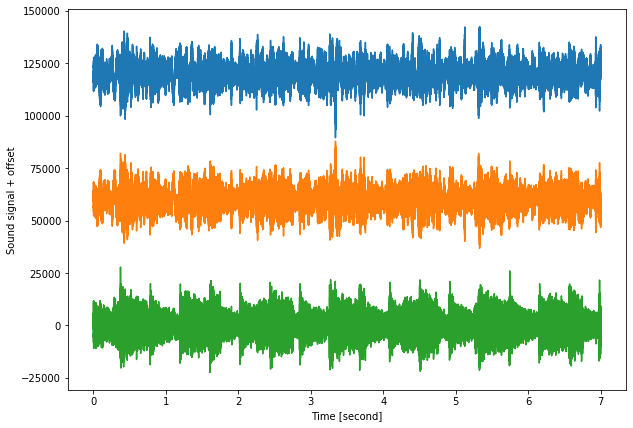

In [53]:
plt.figure(figsize = (10,7))

plt.plot(t, S[:,0]+120000, '-')
plt.plot(t, S[:,1]+60000, '-')
plt.plot(t, S[:,2], '-')

plt.xlabel('Time [second]')
plt.ylabel('Sound signal + offset')
plt.show()

In [54]:
wavfile.write('signal_nowhiten_sound1.wav', fs, np.int16(S[:,0]))
wavfile.write('signal_nowhiten_sound2.wav', fs, np.int16(S[:,1]))
wavfile.write('signal_nowhiten_sound3.wav', fs, np.int16(S[:,2]))

In [55]:
Audio('signal_nowhiten_sound1.wav')

In [56]:
Audio('signal_nowhiten_sound2.wav')

In [57]:
Audio('signal_nowhiten_sound3.wav')

The principal companent analysis (PCA) also tries to interpret the underlying structure of the data by decomposing the data into linear combinations of the principal components. Now I apply PCA to the sounds and see if the signals are cleanly separated in the principal components.

In [58]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
p = pca.fit_transform(data)

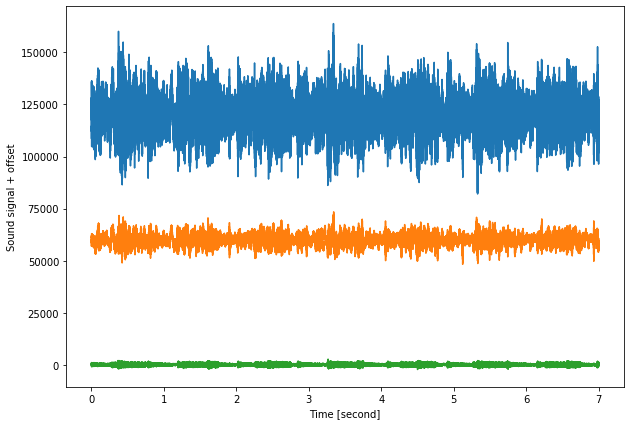

In [59]:
plt.figure(figsize = (10,7))

plt.plot(t, p[:,0]+120000, '-')
plt.plot(t, p[:,1]+60000, '-')
plt.plot(t, p[:,2], '-')

plt.xlabel('Time [second]')
plt.ylabel('Sound signal + offset')
plt.show()

In [60]:
wavfile.write('pc_sound1.wav', fs, np.int16(p[:,0]))
wavfile.write('pc_sound2.wav', fs, np.int16(p[:,1]))
wavfile.write('pc_sound3.wav', fs, np.int16(p[:,2]))

In [61]:
Audio('pc_sound1.wav')

In [62]:
Audio('pc_sound2.wav')

In [63]:
Audio('pc_sound3.wav')

### Image Component Separation

Now let's take a look at another example. Suppose now we have some linearly mixed images, and we are going to find the original photos with ICA. 

In [64]:
import matplotlib.image as mpimg

In [65]:
img1=mpimg.imread('unos.jpg')
img2=mpimg.imread('dos.jpg')
img3=mpimg.imread('tres.jpg')

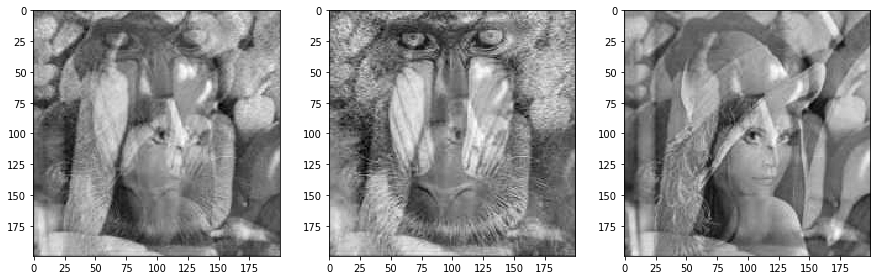

In [66]:
imag = [img1, img2, img3]
plt.figure(figsize=(15,5))
for index, img in enumerate(imag):
    plt.subplot(1, 3, index + 1)
    plt.imshow(img, cmap=plt.cm.gray)

Now I separate the original photos and plot them. 

In [67]:
img = np.c_[img1.flatten(), img2.flatten(), img3.flatten()]
ica = FastICA()
S = ica.fit_transform(img)

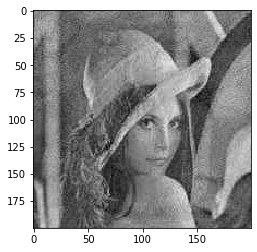

In [71]:
plt.imshow(S[:,0].reshape(200,200), cmap='gray')
plt.show()

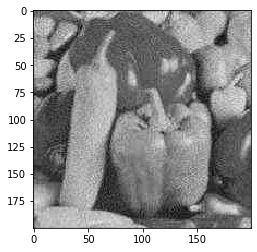

In [69]:
plt.imshow(S[:,1].reshape(200,200), cmap='gray')
plt.show()

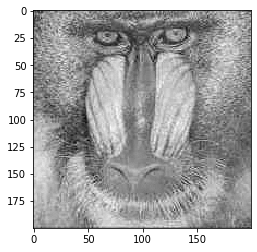

In [70]:
plt.imshow(-S[:,2].reshape(200,200), cmap='gray')
plt.show()